# ML Analysis of Audio
Author: Alec Hoyland


This notebook describes how to visualize and analyze audio signals using supervised and unsupervised machine learning methods.

We explore two audio files, one containing speech and music and the other just speech.
For both, we visualize the waveforms, spectrograms, and compute the log-Mel coefficients.

We build an unsupervised machine learning model for detecting regions of speech using denoising algorithms,
Mel-frequency cepstral coefficients, dimensionality reduction using UMAP, and clustering using K-Means.

We also run the pretrained Whisper model from WhisperCPP on the second signal to transcribe the audio.

## Preamble

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import librosa
import IPython.display as ipd
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import noisereduce
from openunmix.model import Separator
from openunmix.utils import preprocess, load_separator
import torch
from typing import Dict, Tuple
import torchaudio
import umap.plot as uplot;
import umap.umap_ as umap;
from scipy import stats
from sklearn import cluster
import random

%matplotlib inline
plt.style.context("ggplot");

In [3]:
# Fix random seeds
random.seed(42)
np.random.seed(42)

Let's load and listen to the audio files. The first contains English speech and music. The second contains only English speech at a lower sample rate. While the first is a stereo signal, `librosa` automatically mixes to mono, which is better for our purposes, since it's easier to analyze spectrally.

In [4]:
audio1, fs1 = librosa.load("speech-and-music.wav", sr=None)
audio2, fs2 = librosa.load("epi.wav", sr=None)

In [5]:
ipd.Audio(audio1, rate=fs1)

In [6]:
ipd.Audio(audio2, rate=fs2)

## Classical Signal Analysis

We can plot the waveforms.

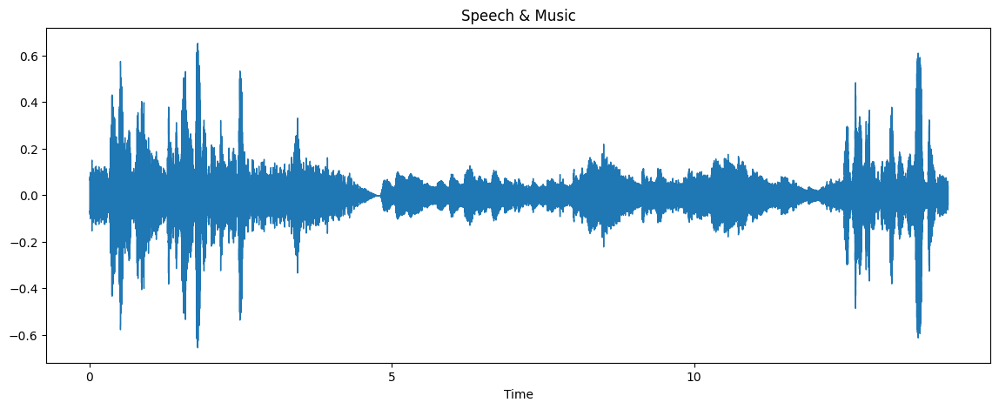

In [7]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(audio1, sr=fs1)
plt.title("Speech & Music");

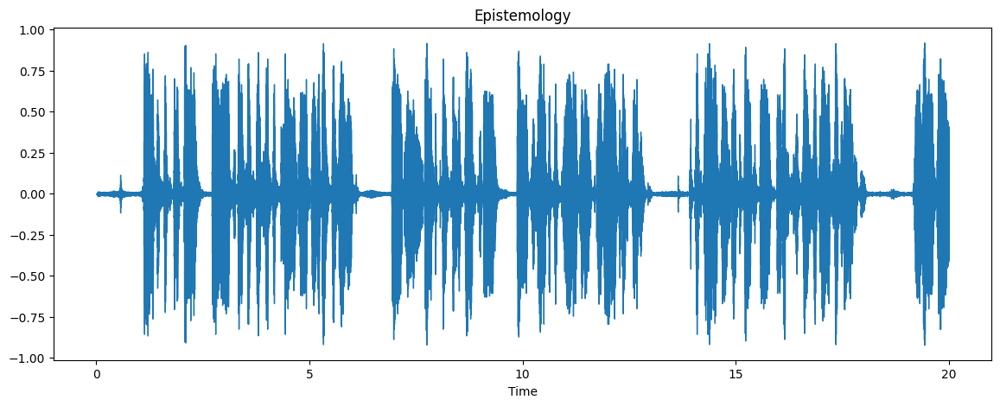

In [8]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(audio2, sr=fs2)
plt.title("Epistemology");

Just from looking at the waveforms, it's clear that the first one has both speech and some other sound and the latter has speech mixed with pauses, probably between phrases. Sibilants such as /s/ appear as sharply-peaked (high frequency) sounds, which tips off that there's speech.

A more useful construction for us is the spectrogram, which we calculate from the short-time Fourier transform (STFT). The STFT computes the Fourier transform of overlapping windowed segments of the signal. I selected the number of FFT points to be about 23 ms, which is a good length for human speech, based on the duration of syllables, with an overlap of 10 ms. I use the Hanning window, which is a squared cosine window to make the signal approximately stationary.

> Poor von Hann, he got completely eclipsed by Hamming.

In [9]:
def stft(signal: np.ndarray, fs: float | int) -> np.ndarray:
    """
    Compute the short-time Fourier transform (STFT)
    with some default values specific to human speech:
        1. Number of FFT points: enough for 23 ms of audio
        2. Window: Hann
        3. Overlaps: every 10 ms

    Arguments
    ---------
    signal: np.ndarray
        The mono signal waveform.
    fs: float | int
        The signal's sample rate.

    Returns
    -------
    np.ndarray
        The short-time Fourier transform of the signal.
    """
    return librosa.stft(
        signal, n_fft=int(23e-3 * fs), window="hann", hop_length=int(10e-3 * fs)
    )

In [10]:
spec1 = stft(audio1, fs1)
spec2 = stft(audio2, fs2)

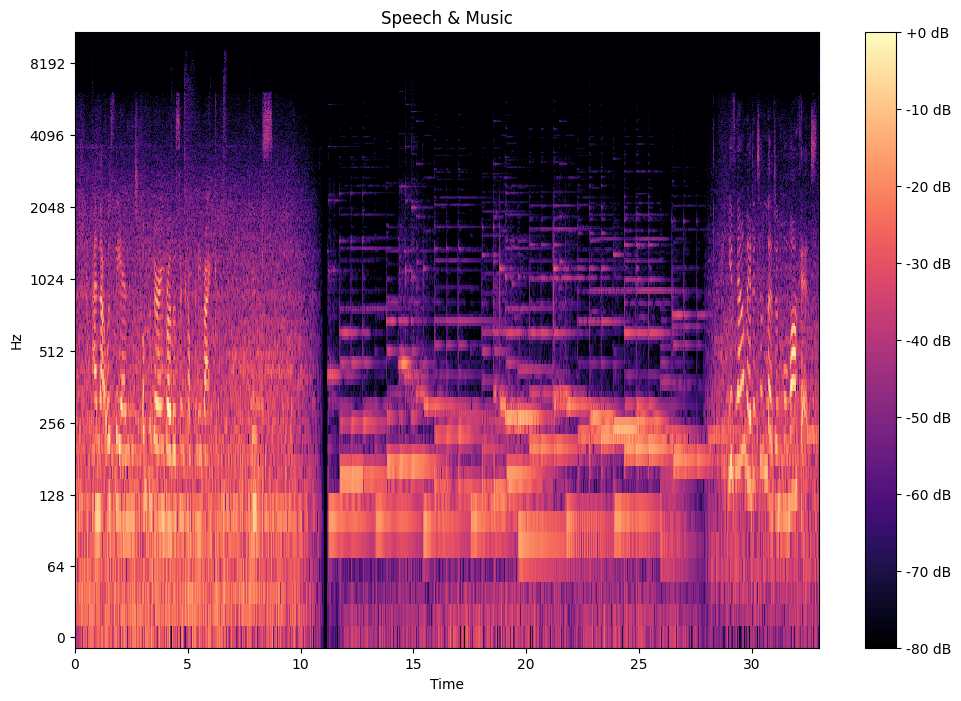

In [11]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)
img = librosa.display.specshow(
    librosa.amplitude_to_db(np.abs(spec1), ref=np.max),
    x_axis="time",
    y_axis="log",
    ax=ax,
)
ax.set(title="Speech & Music")
fig.colorbar(img, ax=ax, format="%+2.f dB");

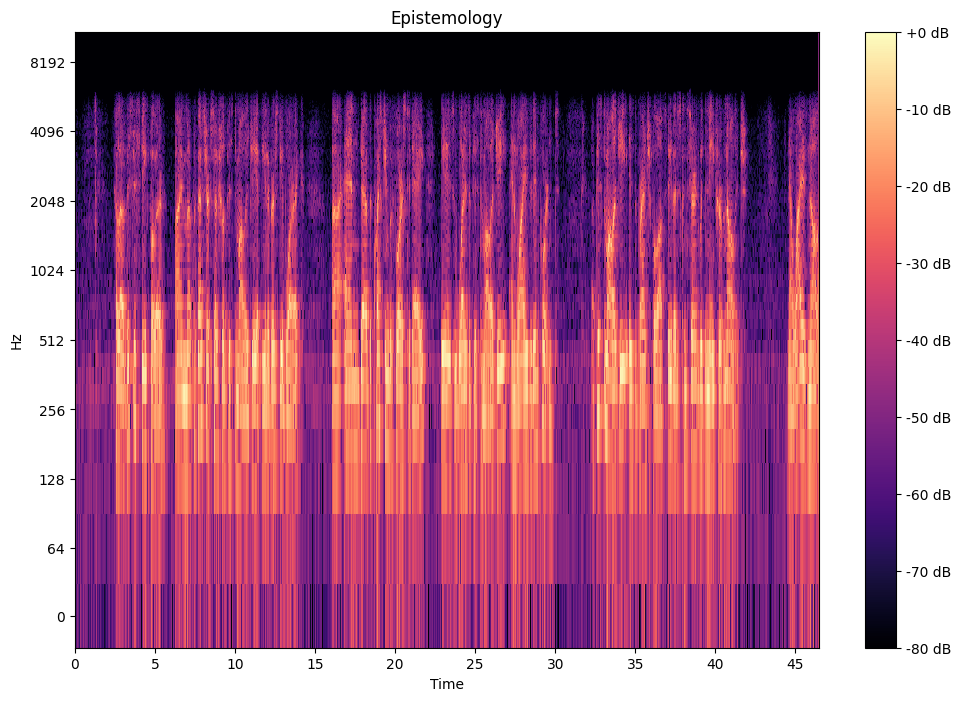

In [12]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)
img = librosa.display.specshow(
    librosa.amplitude_to_db(np.abs(spec2), ref=np.max),
    x_axis="time",
    y_axis="log",
    ax=ax,
)
ax.set(title="Epistemology")
fig.colorbar(img, ax=ax, format="%+2.f dB");

For human speech analysis, a more useful construct is the Mel-frequency cepstrum, which is a representation of the short-term power spectrum of a signal, based on the linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency.

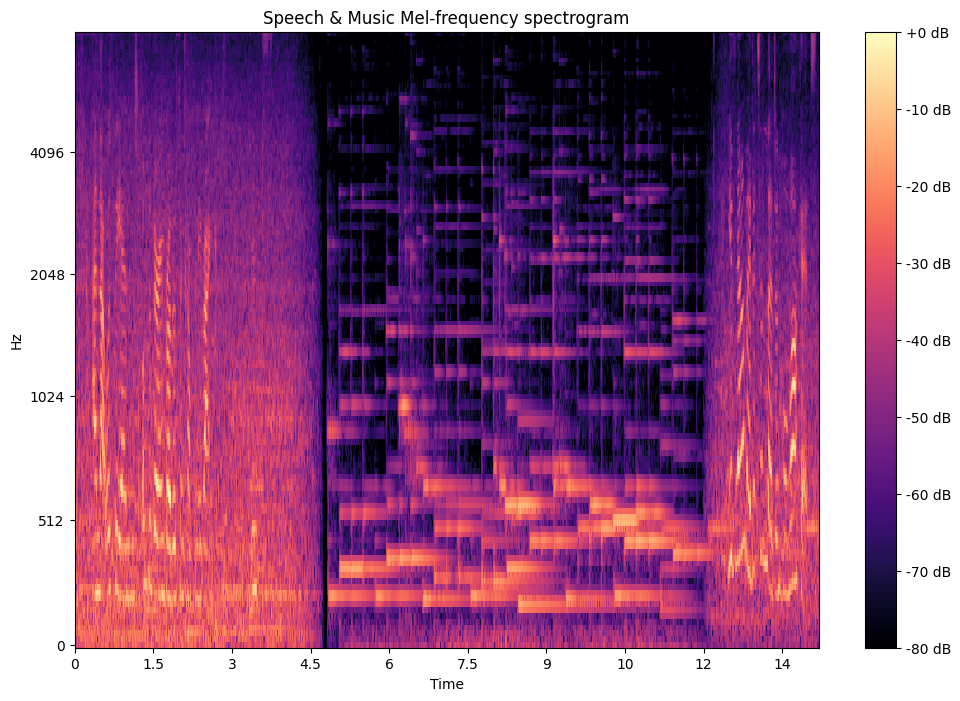

In [13]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)
S = librosa.feature.melspectrogram(y=audio1, sr=fs1, n_mels=128, fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(
    S_dB, x_axis="time", y_axis="mel", sr=fs1, fmax=8000, ax=ax
)
fig.colorbar(img, ax=ax, format="%+2.0f dB")
ax.set(title="Speech & Music Mel-frequency spectrogram");

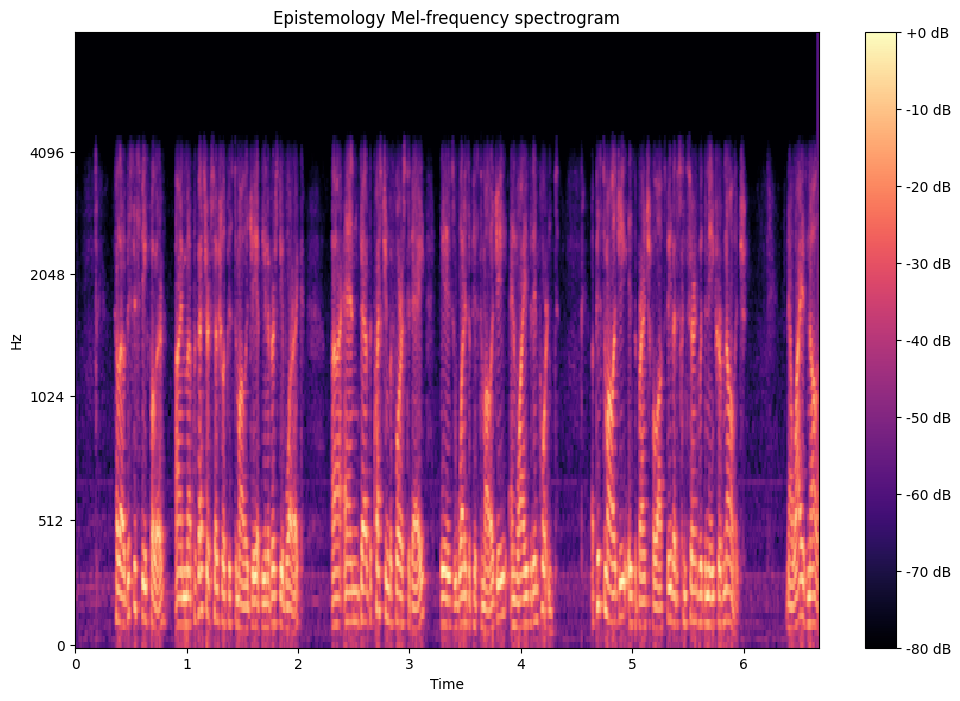

In [14]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)
S = librosa.feature.melspectrogram(y=audio2, sr=fs2, n_mels=128, fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(
    S_dB, x_axis="time", y_axis="mel", sr=fs1, fmax=8000, ax=ax
)
fig.colorbar(img, ax=ax, format="%+2.0f dB")
ax.set(title="Epistemology Mel-frequency spectrogram");

In [15]:
def plot_mel_spec(signal: np.ndarray, fs: int | float):
    """
    Compute and plot the Mel spectrogram of a `signal`
    with sample rate `fs`.

    Arguments
    ---------
    signal: np.ndarray
        The mono signal waveform.
    fs: int | float
        The signal's sample rate in Hz.
    
    Returns
    -------
        None
    """
    S = librosa.feature.melspectrogram(y=signal, sr=fs)
    mfccs = librosa.feature.mfcc(y=signal, sr=fs, n_mfcc=40)

    fig, ax = plt.subplots(nrows=2, sharex=True)
    img = librosa.display.specshow(
        librosa.power_to_db(S, ref=np.max),
        x_axis="time",
        y_axis="mel",
        fmax=8000,
        ax=ax[0],
    )
    fig.colorbar(img, ax=ax[0], format="%+2.0f dB")

    ax[0].set(xlabel="")
    ax[0].set(title="Mel spectrogram")
    ax[0].label_outer()
    img = librosa.display.specshow(mfccs, x_axis="time", ax=ax[1])
    fig.colorbar(img, ax=[ax[1]])
    ax[1].set(title="MFCC")

    return fig, ax

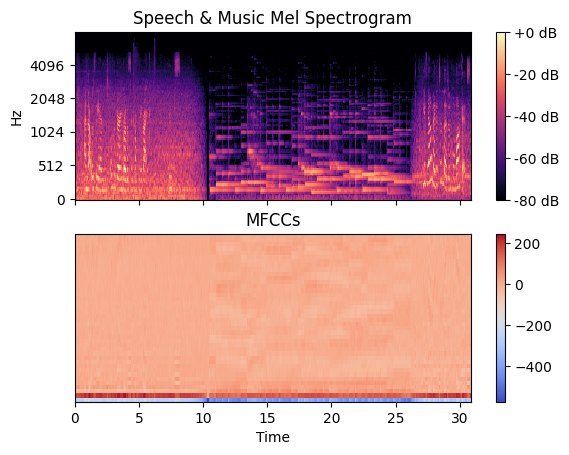

In [16]:
fig, ax = plot_mel_spec(audio1, fs1)
ax[0].set(title="Speech & Music Mel Spectrogram")
ax[1].set(title="MFCCs");

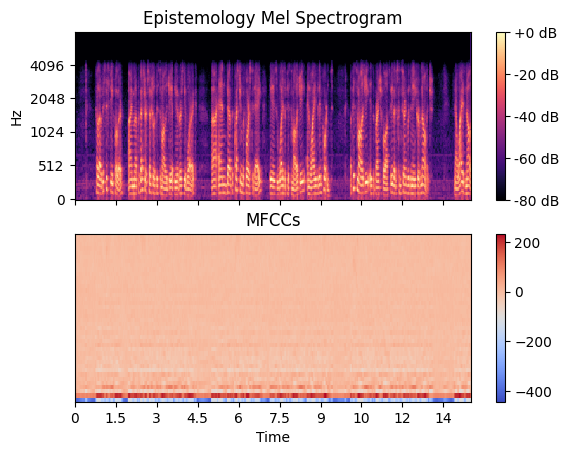

In [17]:
fig, ax = plot_mel_spec(audio2, fs2)
ax[0].set(title="Epistemology Mel Spectrogram")
ax[1].set(title="MFCCs");

## Further Analysis

We have access to two signals. What can we learn about them? I brainstormed some ideas of questions we might want answered:

1. When is someone talking vs. not talking?
2. When someone is talking, what are they saying?
3. If there is music playing, what is the song?
4. How many speakers are there?

I have decided to try to tackle the first question in the first audio file and the second in the second audio file. Let's start with the speech detection question.

### Speech Detection
We're going to try a naive approach to speech detection, where we chunk our signal into short, non-overlapping time-series, engineer features, and then dimensionally reduce and cluster. The hypothesis is that the features of speech are separable from the features of non-speech in a lower-dimensional space, enabling us to build an unsupervised clustering model.

The general steps for this algorithm are:

1. Denoising/Preprocessing
2. Feature Extraction
3. Dimensionality Reduction
4. Clustering

#### Denoising & Processing

By listening to the audio, we can hear that there is speech with background road noise, followed by a musical interlude, and then more speech.

One goal for denoising will be to try to increase the signal-to-noise ratio (SNR) between speech and not-speech by reducing the ambient noise and attenuating the non-speech sound.

> We could also try to eliminate pauses/non-speech, which we could do by filtering out segments where the average loudness is less than 1%. I didn't end up implementing this filtering due to lack of time.

In the first audio clip, there is road noise, which we are going to attempt to filter out using a spectral gating algorithm. Spectral gating computes a spectrogram of a signal and estimates a noise threshold (gate) for each frequency band of that signal. That threshold is used to compute a mask which gates noise below the frequency-varying threshold. For non-stationary signals, this algorithm is applied sequentially, continually updating the noise threshold over time.

In [18]:
audio1_denoised = noisereduce.reduce_noise(
    y=audio1,
    sr=fs1,
    stationary=False,
    time_mask_smooth_ms=25,
    n_fft=int(23 * fs1 / 1000),
    hop_length=int(10 * fs1 / 1000),
)

In [19]:
ipd.Audio(audio1_denoised, rate=fs1)

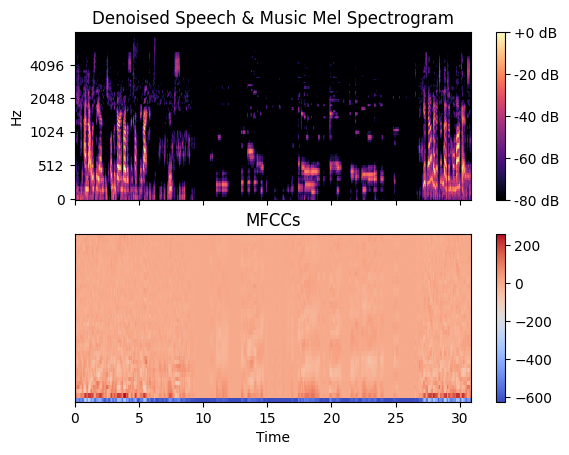

In [20]:
fig, ax = plot_mel_spec(audio1_denoised, fs1)
ax[0].set(title="Denoised Speech & Music Mel Spectrogram")
ax[1].set(title="MFCCs");

I also tried a pretrained deep learning model called `Open Unmix` (UMX) comprised of bilateral LTSM layers that tries to predict and separate vocals from other sounds. However, this model was trained on music, not human speech, and so does an excellent job of picking out the musical interlude, but does not enhance the SNR of the speech sections themselves. *However*, the while the road noise is not attenuated using the "vocal" model, the musical section is strongly diminished, which I expect will help with our clustering.

In [21]:
def unmix(signal: np.ndarray, sr: int | float) -> Dict[str, np.ndarray]:
    """
    Unmix an audio signal into vocals and non-vocals.
    This function will work with stereo signals
    but will mix them into mono signals.

    Arguments
    ---------
    signal: np.ndarray
        A mono audio signal.
    sr: int | float
        The sampling rate (in Hz) of the signal.

    Returns
    -------
    Dict[str, np.ndarray]
        A dictionary containing two keys: "vocal" and "other"
        with corresponding values, which are the unmixed signals.
    """
    separator: Separator = load_separator(
        model_str_or_path="umxl",
        targets=["vocals", "other"],
        device=torch.device("cpu"),
    )

    # convert to torch Tensor
    signal_tensor = preprocess(torch.Tensor(signal), sr, separator.sample_rate)

    # compute estimates
    estimates = separator(signal_tensor)
    estimates: Dict[str, torch.Tensor] = separator.to_dict(
        estimates, aggregate_dict=None
    )

    for key, value in estimates.items():
        # resample back to the original sampling rate
        value = torchaudio.transforms.Resample(
            orig_freq=separator.sample_rate,
            new_freq=sr,
            resampling_method="sinc_interpolation",
        )(value)
        # collapse the duplicated channel dimension
        # and squeeze the batch dimension
        estimates[key] = value.mean(dim=1).squeeze(dim=0).detach().numpy()
    return estimates

In [22]:
estimates = unmix(audio1, fs1)

In [23]:
ipd.Audio(estimates["vocals"], rate=fs1)

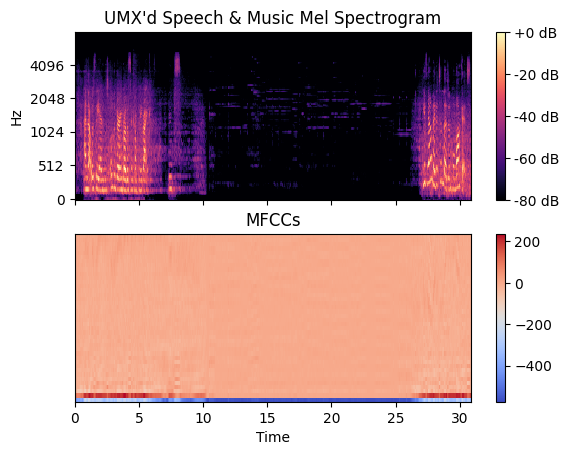

In [24]:
fig, ax = plot_mel_spec(estimates["vocals"], fs1)
ax[0].set(title="UMX'd Speech & Music Mel Spectrogram")
ax[1].set(title="MFCCs");

In [25]:
ipd.Audio(estimates["other"], rate=fs1)

#### Feature Extraction

Supposing that we have our audio signal sufficiently denoised, the next step is to compute salient features. I chose to compute MFCCs and the first and second finite differences of the MFCCs.

The basic theory is that by dividing the waveform into 20-40 ms sections (I chose 23 ms), the signal is approximately stationary (especially when windowed). I used overlapping windows with a hop length of 10 ms. To recognize the frequencies present in the short segments, we compute the power spectrum using discrete-time fast Fourier transforms. To better distinguish between individual frequencies in the raw power spectrum, especially in the high frequency range where stop consonants and sibilant live, we convolve the spectrum with triangular Mel filters. These filters are spaced according to a Mel-spaced frequency range (logarithmic) to encapsulate information about how the human cochlea works. The filters start narrow at low frequencies and get wider at higher frequencies. Since human speech co-evolved with human hearing, human speech is better-analyzed by mimicking some of the signal processing that the human auditory system does. The next step traditionally is to decorrelated the filterbank energies using a discrete cosine transform (DCT) to acquiire the MFCCs, though for some deep learning models, it's preferred to use the log Mel filterbank features directly. 

Since we want a low-dimensional representation, since we have limited data, I elected to compute the MFCCs (with the DCT). 

I also computed the "delta" and "delta-delta" coefficients, which are the first and second finite differences, using the central finite difference formula. These quantities represent the change in coefficients over "MFC-time."

> I tried varying the number of filters in the Mel filterbank. I tried 26 filter and 40 filters. Theoretically, this would effect the coarseness of the MFCCs (as they would cover more frequencies in the 26-filter case). I also tried setting the minimum and maximum frequency for the filters. The values hard-coded into `extract_features` are the best I found from about 20 minutes of experimentation.

> I also didn't see a real improvement from pre-emphasis filtering, which bolsters the amplitudes of higher frequencies. I also didn't seen an improvement from liftering.

> I *did however* see an incredible improvement with mean-normalization over z-scoring. Without mean-normalization, there's some confusion when the speaker pauses.

> At this point, if you have training data, you could skip using the delta and delta-delta features and instead multiply by an "LDA-like" (linear discriminant analysis) matrix to acquire useful linear combinations of MFCCs (this is a generalization of the delta/delta-delta approach), but this requires training data, since you have to learn this matrix.

In [26]:
def pre_emphasis(signal: np.ndarray, factor: float = 0.97) -> np.ndarray:
    """
    Perform pre-emphasis filtering, which amplifies higher frequencies.

    Arguments
    ---------
    signal: np.ndarray
        A mono audio signal.
    factor: float, default: 0.97
        Emphasis factor.
    
    Returns
    -------
    np.ndarray
        The emphasized signal.    
    """

    return np.append(signal[0], signal[1:] - factor * signal[1:])

In [27]:
def mean_normalize(mfccs: np.ndarray) -> np.ndarray:
    """
    Subtract the mean of `mfccs` from `mfccs`.

    Arguments
    ---------
    mfccs: np.ndarray
        A feature vector of MFCCs of shape `(n_coeffs, n_frames)`.

    Returns
    -------
    np.ndarray
        The `mfccs` vector with the mean subtracted.
    """
    return mfccs - np.mean(mfccs, axis=1)[:, None] + np.finfo(float).eps

In [28]:
def lifter(mfccs: np.ndarray) -> np.ndarray:
    """
    Perform sinusoidal liftering.
    
    Arguments
    ---------
    mfccs: np.ndarray
        A feature vector of MFCCs of shape `(n_coeffs, n_frames)`.

    Returns
    -------
    np.ndarray
        The liftered `mfccs`.
    """

    n_coeffs, _ = mfccs.shape
    n = np.arange(n_coeffs)
    lift = 1 + (n_coeffs / 2) * np.sin(np.pi * n / n_coeffs)
    return mfccs * lift

In [29]:
def extract_features(
                    signal: np.ndarray,
                    fs: int | float,
                    n_mfcc: int = 26,
                    liftering: bool = False,
                    normalize: bool = False
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Extract Mel-frequency cepstral coefficients
    and their finite differences
    for use as features.

    Arguments
    ---------
    signal: np.ndarray
        A mono audio signal.
    fs: int | float
        The sampling rate (in Hz) of the signal.
    n_mfcc: int, default: 13
        The number of MFCCs to compute. Should be 13 or greater.
    liftering: bool, default: False
        Whether to lifter.
    normalize: bool, default: False
        Whether to mean-normalize.

    Returns
    -------
    np.ndarray
        MFCCs and the first and second finite-differences
        as a matrix of shape `(36, N)`.
    np.ndarray
        Vector of timestamps corresponding to each MFCC, in seconds.
    """
    
    n_fft = int(23 * fs1 / 1000)
    hop_length = int(10 * fs1 / 1000)

    assert n_mfcc >= 13, "Are you sure you want fewer than 13 MFCCs?"

    mfccs = librosa.feature.mfcc(
                                y=signal, 
                                sr=fs, 
                                n_mfcc=n_mfcc, 
                                n_fft=n_fft, 
                                hop_length=hop_length,
                                # fmin=300,
                                # fmax=8000,
                                # window="hann"
    )[1:13, :]

    if liftering:
        mfccs = lifter(mfccs)
    
    if normalize:
        mfccs = mean_normalize(mfccs)

    deltas = librosa.feature.delta(mfccs)
    ddeltas = librosa.feature.delta(mfccs, order=2)

    audio_length = len(signal) / fs
    step = hop_length / fs
    interval_s = np.arange(start=0, stop=audio_length, step=step)

    return np.concatenate([mfccs, deltas, ddeltas]), interval_s

In [30]:
# estimates["vocals"] = pre_emphasis(estimates["vocals"])
features, interval_s = extract_features(estimates["vocals"], fs1, n_mfcc=40, liftering=False, normalize=True)
features = features.transpose()

In [31]:
features2, interval_s2 = extract_features(audio1_denoised, fs1, n_mfcc=40)
features2 = features2.transpose()

#### Dimensionality Reduction

For dimensionality reduction, we used Unifold Manifold Approximation and Projection (UMAP), which is a very robust nonlinear dimensionality reduction algorithm that projects data points onto a lower-dimensional manifold. What we hope to see is two clusters, one for speech and one for not-speech.

One advantage of UMAP is that new points can be embedded into the space without recomputing the entire embedding. This means that if we were given additional audio, we could embed it directly much faster than if we were using PCA or t-SNE or another dimensionality reduction algorithm. This gets us closer to a near-real-time algorithm.

However, UMAP does not understand or respect temporal ordering of the features. As such, it is going to jumble all of the points together. We will have to detangle and smooth afterwards. 

> There are extensions to the basic UMAP algorithm such as `AlignedUMAP` (AUMAP) for handling these cases. AUMAP runs UMAP sequentially on segments of data; however, we still don't have a lot of data. I used the vanilla UMAP algorithm here.

> Another possibility is non-negative matrix factorization (NMF), such as via the `seqNMF` package by my former lab-mate Alex Williams. Unfortunately, it's written in MATLAB, and I didn't translate it to Python for this notebook.

To validate our approach, I manually-labeled the audio file, using some rough estimates of when the speech starts and stops ($ x < 4$ s or $x > 12.5$ s). These aren't the most accurate labels, as we will see further on.

In [32]:
gt_labels = (interval_s < 4.0) | (interval_s > 12.5)
labels = np.array(
    ["speech" if gt_labels[i] else "not speech" for i in range(len(gt_labels))]
)

In [33]:
gt_labels2 = (interval_s2 < 4.0) | (interval_s2 > 12.5)
labels2 = np.array(
    ["speech" if gt_labels2[i] else "not speech" for i in range(len(gt_labels2))]
)

For this first attempt, I use the features that have been extracted using the pretrained UMX model. I embed the features using the UMAP model and plot, labeling the points with the (likely inaccurate) manual labels I created.

In [34]:
mapper = umap.UMAP(
    n_neighbors=15, n_components=2, min_dist=0.1, metric="euclidean"
).fit(features)

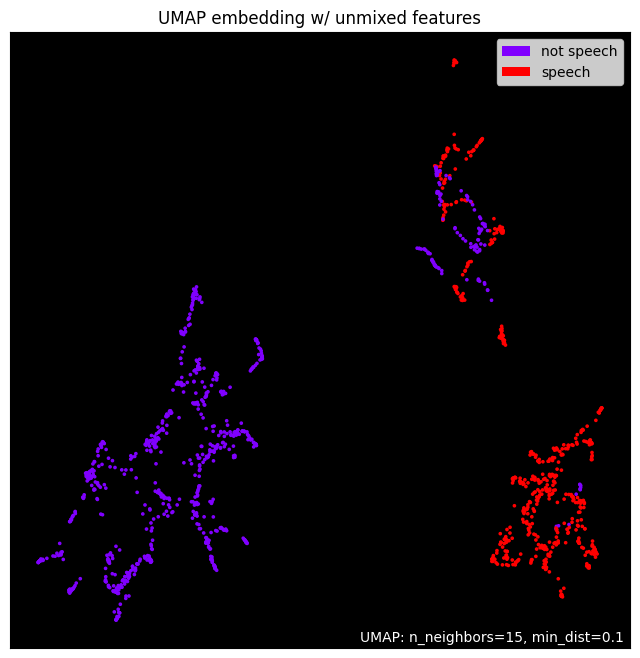

In [35]:
ax = uplot.points(mapper, labels=labels, theme="fire")
ax.set_title("UMAP embedding w/ unmixed features");

For the second attempt, I do the same with the spectral-gated features.

In [36]:
mapper2 = umap.UMAP(
    n_neighbors=15, n_components=2, min_dist=0.1, metric="euclidean"
).fit(features2)

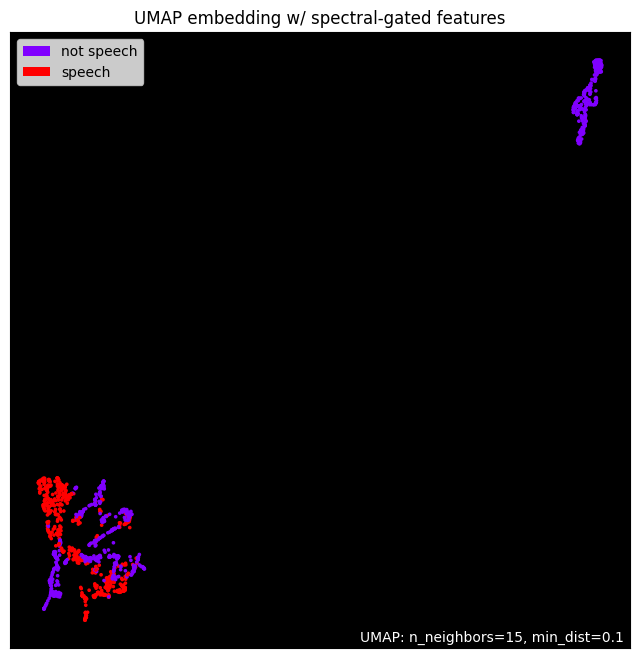

In [37]:
ax = uplot.points(mapper2, labels=labels2, theme="fire")
ax.set_title("UMAP embedding w/ spectral-gated features");

Taking a look at both of these plots, I like the look of the UMX-denoised embedding better. The clusters are much more distinct.
This is likely due to the music section in the UMX'd audio clip being strongly attenuated.

#### Clustering

Here is what it looks like when you cluster into $k=2$ clusters with the K-Means algorithm. I use Elkan's algorithm, which works better and faster when there are well-defined clusters. K-Means produces a clean cutoff right throught the middle of the embedding, so while there will be some missed points (judging by the points colored by my "ground truth"), the feature extraction, dimensionality reduction, and clustering did a pretty good job of separating speech from not-speech.

> To quantify this, we could compute accuracy, since this is essentially a binary classification task. However, since my ground truth is only a crude estimate and the visualizations provide a pretty clear picture, I elected not to compute formal metrics here.

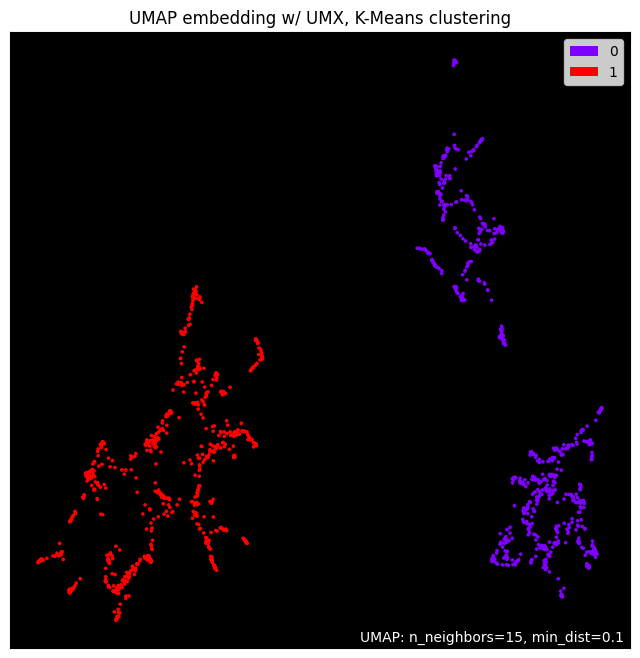

In [38]:
clusterer = cluster.KMeans(n_clusters=2, algorithm="elkan", n_init=10).fit(
    mapper.transform(features)
)

ax = uplot.points(mapper, labels=clusterer.labels_, theme="fire")
ax.set_title("UMAP embedding w/ UMX, K-Means clustering");

There's a curious separation into three clusters naturally, however. To investigate this further, I clustered with $k=3$ clusters as well.

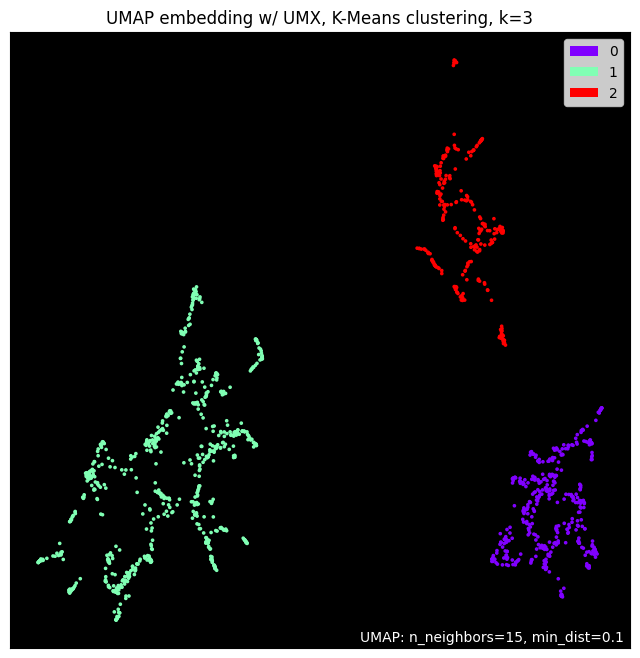

In [39]:
clusterer_k3 = cluster.KMeans(n_clusters=3, algorithm="elkan", n_init=10).fit(
    mapper.transform(features)
)

ax = uplot.points(mapper, labels=clusterer_k3.labels_, theme="fire")
ax.set_title("UMAP embedding w/ UMX, K-Means clustering, k=3");

#### Visualization

How does this clustering look on the waveform?

The clustering happens on data points in "MFCC-space," so we have to translate those data points back to "time-space" to color-map onto the waveform. The function `get_timepoint_labels_from_clusterer` expands the MFCC-space cluster labels onto a full time-space vector.

Pretty good! We can see the speech sections at the beginning and end, with the musical interlude in the middle.

> The plotting function I am using doesn't like None or NaN values, and doesn't support coloring different sections of the envelope different colors. So instead, I plotted two signals, one for "speech" and one for "not speech" and set the amplitudes to zero when appropriate.

In [40]:
def get_timepoint_labels_from_clusterer(
    clusterer: cluster.KMeans, interval_s: np.ndarray, signal: np.ndarray, fs: int | float
) -> np.ndarray:
    """
    Create a vector of shape equal to `signal`'s shape,
    that contains the labels from the `clusterer`.

    Arguments
    ---------
    clusterer: KMeans
        A fit `KMeans` clusterer.
        Any other clusterer that follows the `sklearn` specification
        should work as well.
    interval_s: np.ndarray
        An array mapping the MFCC coefficients to their timestamps.
    signal: np.ndarray
        A mono audio signal.
    fs: int | float
        The sampling rate (in Hz) of the signal.

    Returns
    -------
    np.ndarray
        Array the same shape as `signal`
        that contains the label for each sample.
    """
    assert clusterer.labels_.shape == interval_s.shape

    labels_mfcc = clusterer.labels_
    labels_t = np.empty_like(signal)
    labels_t.fill(np.nan)
    time_t = np.linspace(start=0, stop=(len(signal) - 1) / fs, num=len(signal))

    for i in range(1, len(labels_mfcc)):
        indices = (time_t >= interval_s[i - 1]) & (time_t < interval_s[i])
        labels_t[indices] = labels_mfcc[i]
    labels_t[time_t >= interval_s[-1]] = labels_mfcc[-1]

    return labels_t

In [41]:
def filter_waveform(signal: np.ndarray, labels: np.ndarray, label: int) -> np.ndarray:
    """
    Filter a signal, by setting the amplitude to zero
    if the label for that timepoint does not match `label`.

    Arguments
    ---------
    signal: np.ndarray
        A mono audio signal of length `n_samples`.
    labels: np.ndarray
        A vector containing a label for each sample in `signal`,
        of length `n_samples`.
    label: int
        The label to filter by.

    Returns
    -------
    np.ndarray
        The filtered signal.
    """
    assert len(signal) == len(labels)
    temp = signal.copy()
    temp[labels != label] = 0
    return temp

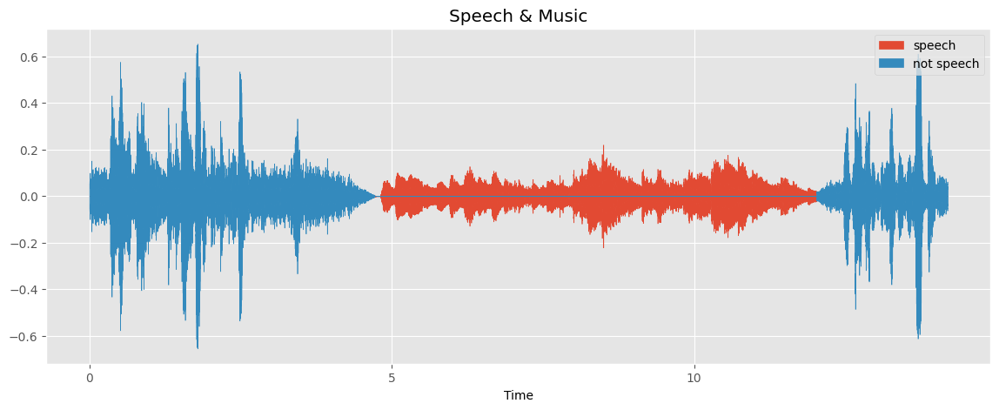

In [42]:
plt.figure(figsize=(14, 5))
plt.style.use("ggplot")
labels_t = get_timepoint_labels_from_clusterer(clusterer, interval_s, audio1, fs1)
speech_waveform = filter_waveform(audio1, labels_t, 1)
not_speech_waveform = filter_waveform(audio1, labels_t, 0)
librosa.display.waveshow(speech_waveform, sr=fs1, label="speech")
librosa.display.waveshow(not_speech_waveform, sr=fs1, label="not speech")
plt.title("Speech & Music")
plt.legend();

Wow, that's way better than I had expected. We were able to separate speech from not-speech with near-perfect accuracy. Below I have plotted the "speech detections" as a raster plot.

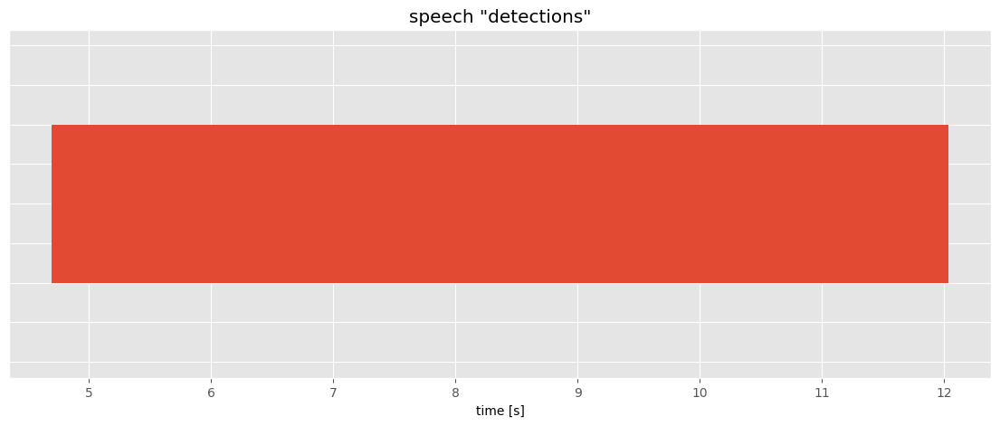

In [43]:
plt.figure(figsize=(14, 5))
events = np.argwhere(labels_t == 1)
plt.eventplot(events.transpose() / fs1)
ax = plt.gca()
ax.set_title('speech "detections"')
ax.set_xlabel("time [s]")
ax.set_yticklabels([])
ax.set_ylabel(None)
ax.tick_params(left=False);

#### Post-Processing Speech Detections

One thing that was key to our analysis here was *not* to naively normalize our features. It's a gut-instinct for a lot of data science and machine learning endeavors, as some algorithms (such as PCA) more or less require it and it helps stabilize backpropagation. However, in the case of MFCCs, *how you normalize* matters a lot. Rescaling to mean-zero (additively) is important, but keeping the variation multiplicatively is crucial.

In the following section, I will use z-score-normalized features to show what I would do if we *didn't* get as good separation of clusters as we have seen above.

In [44]:
features3, interval_s = extract_features(estimates["vocals"], fs1, n_mfcc=40, liftering=False, normalize=False)
features3 = features3.transpose()
features3 = stats.zscore(features3, axis=0)

In [45]:
mapper3 = umap.UMAP(
    n_neighbors=15, n_components=2, min_dist=0.1, metric="euclidean"
).fit(features3)

clusterer3 = cluster.KMeans(n_clusters=2, algorithm="elkan", n_init=10).fit(
    mapper3.transform(features3)
);

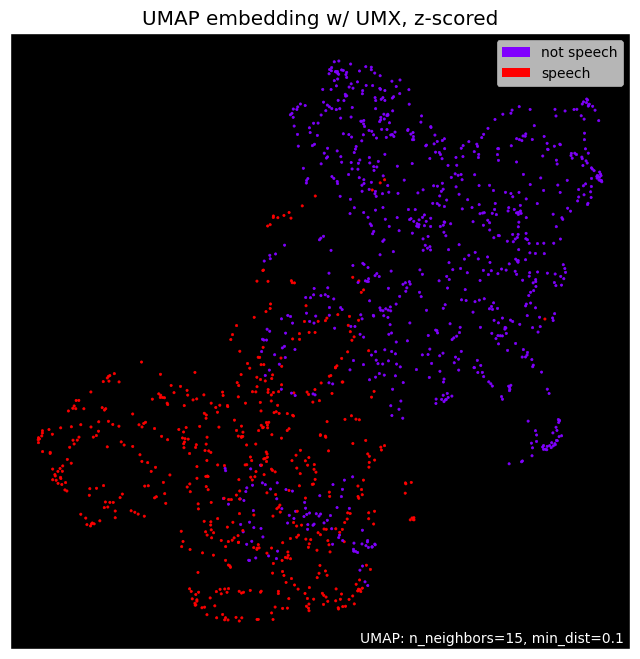

In [46]:
ax = uplot.points(mapper3, labels=labels, theme="fire")
ax.set_title("UMAP embedding w/ UMX, z-scored");

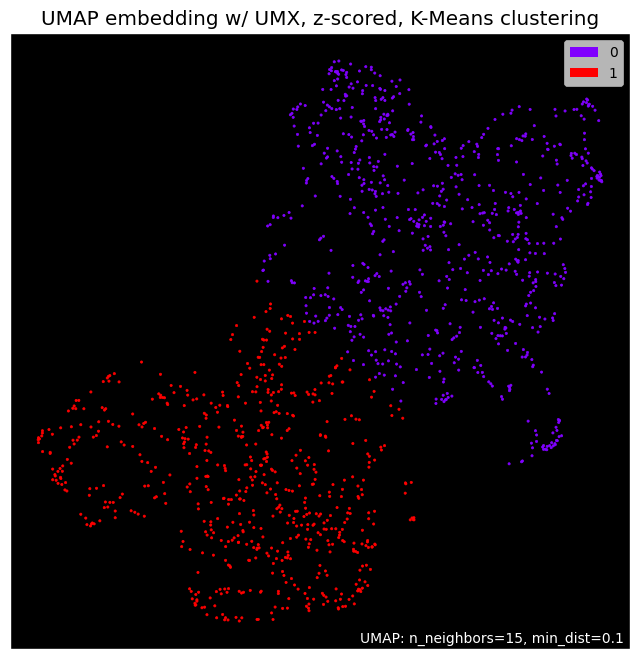

In [47]:
ax = uplot.points(mapper3, labels=clusterer3.labels_, theme="fire")
ax.set_title("UMAP embedding w/ UMX, z-scored, K-Means clustering");

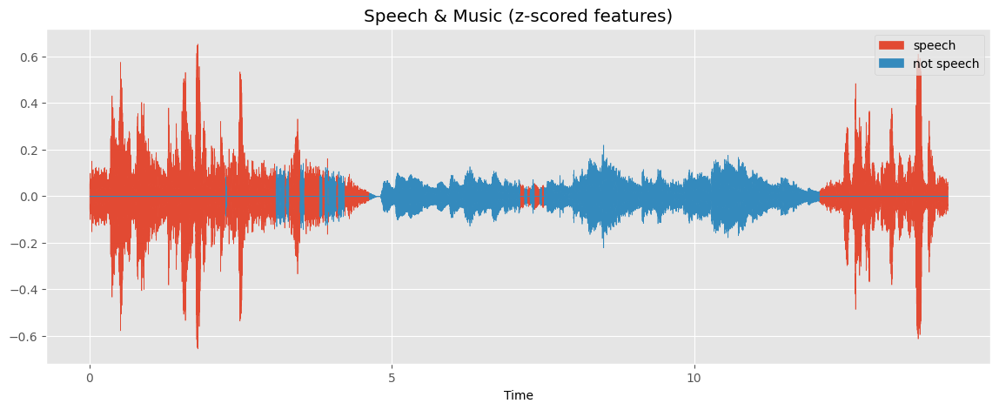

In [48]:
plt.figure(figsize=(14, 5))
plt.style.use("ggplot")
labels_t = get_timepoint_labels_from_clusterer(clusterer3, interval_s, audio1, fs1)
speech_waveform = filter_waveform(audio1, labels_t, 1)
not_speech_waveform = filter_waveform(audio1, labels_t, 0)
librosa.display.waveshow(speech_waveform, sr=fs1, label="speech")
librosa.display.waveshow(not_speech_waveform, sr=fs1, label="not speech")
plt.title("Speech & Music (z-scored features)")
plt.legend();

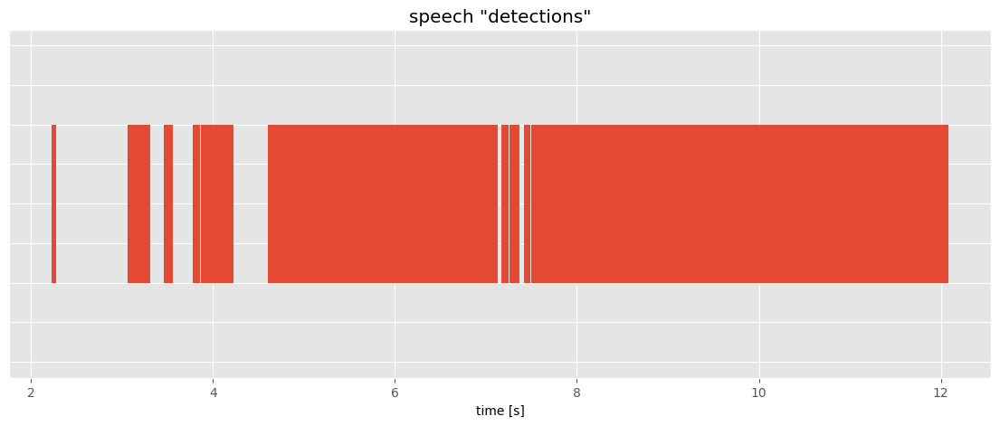

In [49]:
plt.figure(figsize=(14, 5))
events = np.argwhere(labels_t == 0)
plt.eventplot(events.transpose() / fs1)
ax = plt.gca()
ax.set_title('speech "detections"')
ax.set_xlabel("time [s]")
ax.set_yticklabels([])
ax.set_ylabel(None)
ax.tick_params(left=False);

I considered attempting to smooth the detections similarly to how spike train data in neuroscience is handled with a 2-tailed or 1-tailed filter or exponential moving average. That works best when you know the distribution, so you can tailor the filter. For instance, spike trains follow a Poisson distribution generally, so exponential filters work well. I spent a couple of hours fiddling with different filters but the signal isn't stationary so a "one-size fits all" approach wasn't working.

There's another method that's statistically-based that works quite well too, based on the concept of inter-spike intervals in computational neuroscience.

1. Compute the inter-event intervals (IEIs) between each detected speech event. 
2. This will give you a distribution of IEIs. 
3. From there, it's clear that there will be thousands of IEIs of very small size and a few that are larger. 
4. It's possible to get a clear cutoff from the distribution, then walk through the event plot and section off regions that indicate sustained detections (i.e., regions of sustained speech, even with small pauses). 
5. This method can filter out erroneous "orphan" detects, such as those in the middle of the plot, though one still needs a heuristic or other model to decide which segments to keep and which to discard.

> I actually have code for this from my friend Srinivas, but it's in MATLAB. https://github.com/sg-s/srinivas.gs_mtools/tree/master/src/%2Bneurolib


> This is not the only way to go about this. We could also train a small classifier model to output the probability that the next time-point is a "speech" time point. The model would learn from the previous data points, say the past 10 or so. A simple example would be a logistic regression model or neural network. This has the advantage of working in a "streaming" context.

(0.0, 12.0)

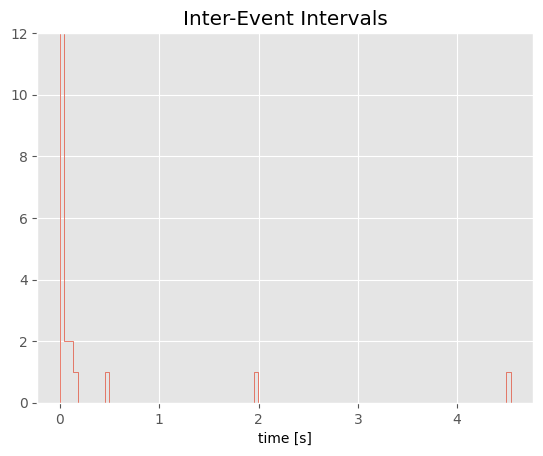

In [50]:
spiketimes = np.argwhere(labels_t) / fs1
ieis = np.diff(spiketimes, n=1, axis=0)
counts, bins = np.histogram(ieis, bins=100)
plt.stairs(counts, bins)
ax = plt.gca()
ax.set_title("Inter-Event Intervals")
ax.set_xlabel("time [s]")
ax.set_ylim([0, 12])

#### 3-class Clustering

Recall that we saw a natural separation into three clusters, not two, in the UMAP projection space.
Let's take a look at that figure again.

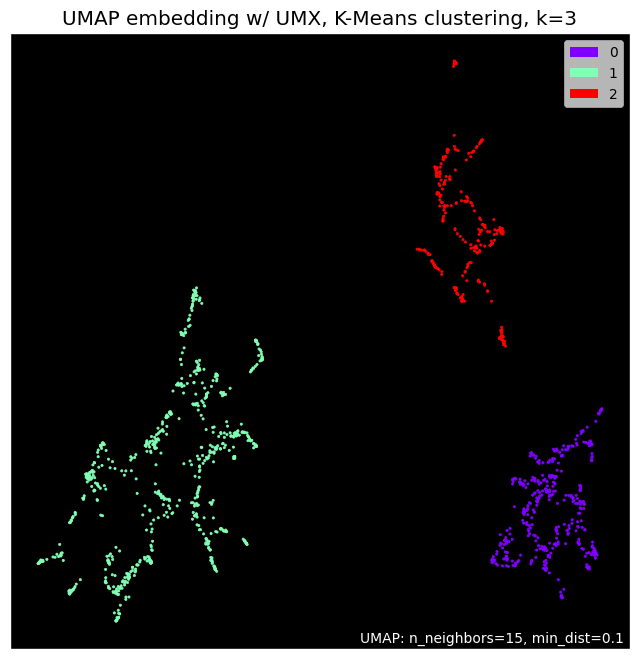

In [51]:
ax = uplot.points(mapper, labels=clusterer_k3.labels_, theme="fire")
ax.set_title("UMAP embedding w/ UMX, K-Means clustering, k=3");

Here's what it looks like when we map those class labels back onto the waveform:

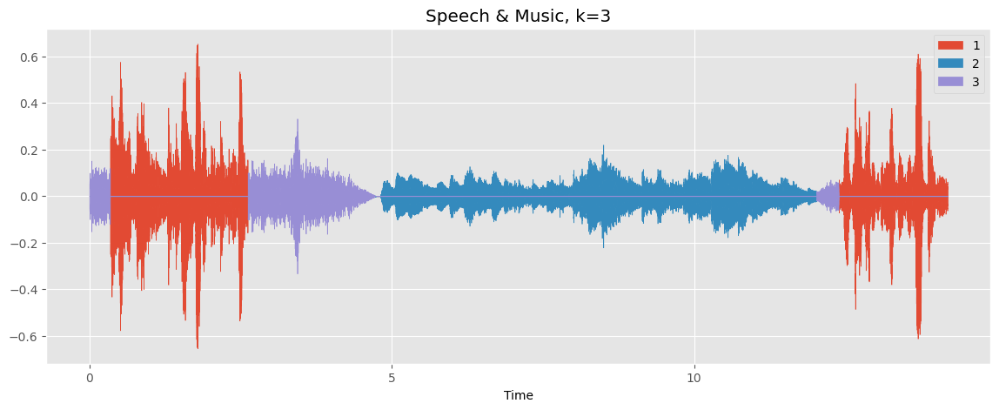

In [52]:
plt.figure(figsize=(14, 5))
plt.style.use("ggplot")
labels_t = get_timepoint_labels_from_clusterer(clusterer_k3, interval_s, audio1, fs1)
waveform1 = filter_waveform(audio1, labels_t, 0)
waveform2 = filter_waveform(audio1, labels_t, 1)
waveform3 = filter_waveform(audio1, labels_t, 2)
librosa.display.waveshow(waveform1, sr=fs1, label="1")
librosa.display.waveshow(waveform2, sr=fs1, label="2")
librosa.display.waveshow(waveform3, sr=fs1, label="3")
plt.title("Speech & Music, k=3")
plt.legend();

We've identified three regions now:

1. Speech
2. Music
3. "Fade-in/out"

If you listen carefully to the input audio, you can hear that there's a fade-out before the musical interlude and a fade-in before the speech begins again. In the waveform, we can see the amplitude envelope fade-out to zero befor the musical interlude just before the 5-second mark and we can see a fade back in around 12.5 seconds. Our unsupervised model is capable of detecting these regions by analysis of the spectral content! We didn't look for this result on purpose, but because we were used unsupervised dimensionality reduction and clustering methods, we got this bonus information for free.

## Automated Speech Recognition

On the second audio file, we will use the Whisper model to transcribe speech.

Whisper is a pretrained model from OpenAI that was trained using self-supervised and supervised methods on a large corpus of speech and text. There's a great implementation in C++ that runs pretty well on the CPU.

The audio is clear and in English, so I elected to use the "tiny" model trained on an English-only corpus. The model runs in C++, but there are convenient Python bindings.

In [53]:
from pywhispercpp.model import Model

In [54]:
model = Model("tiny.en", n_threads=6);

[2023-09-29 11:15:32,461] {utils.py:38} INFO - No download directory was provided, models will be downloaded to /home/alec/.local/share/pywhispercpp/models
[2023-09-29 11:15:32,462] {utils.py:46} INFO - Model tiny.en already exists in /home/alec/.local/share/pywhispercpp/models
[2023-09-29 11:15:32,462] {model.py:221} INFO - Initializing the model ...


whisper_init_from_file_no_state: loading model from '/home/alec/.local/share/pywhispercpp/models/ggml-tiny.en.bin'
whisper_model_load: loading model
whisper_model_load: n_vocab       = 51864
whisper_model_load: n_audio_ctx   = 1500
whisper_model_load: n_audio_state = 384
whisper_model_load: n_audio_head  = 6
whisper_model_load: n_audio_layer = 4
whisper_model_load: n_text_ctx    = 448
whisper_model_load: n_text_state  = 384
whisper_model_load: n_text_head   = 6
whisper_model_load: n_text_layer  = 4
whisper_model_load: n_mels        = 80
whisper_model_load: ftype         = 1
whisper_model_load: type          = 1
whisper_model_load: mem required  =  201.00 MB (+    3.00 MB per decoder)
whisper_model_load: adding 1607 extra tokens
whisper_model_load: model ctx     =   73.58 MB
whisper_model_load: model size    =   73.54 MB
whisper_init_state: kv self size  =    2.62 MB
whisper_init_state: kv cross size =    8.79 MB


In [55]:
segments = model.transcribe("epi.wav", speed_up=True)

[2023-09-29 11:15:32,535] {model.py:130} INFO - Transcribing ...
[2023-09-29 11:15:34,127] {model.py:133} INFO - Inference time: 1.592 s


whisper_full_with_state: progress =   5%
whisper_full_with_state: progress =  10%
whisper_full_with_state: progress =  15%
whisper_full_with_state: progress =  20%
whisper_full_with_state: progress =  25%
whisper_full_with_state: progress =  30%
whisper_full_with_state: progress =  35%
whisper_full_with_state: progress =  40%
whisper_full_with_state: progress =  45%
whisper_full_with_state: progress =  50%
whisper_full_with_state: progress =  55%
whisper_full_with_state: progress =  60%
whisper_full_with_state: progress =  65%
whisper_full_with_state: progress =  70%
whisper_full_with_state: progress =  75%
whisper_full_with_state: progress =  80%
whisper_full_with_state: progress =  85%
whisper_full_with_state: progress =  90%


Inference took 1.5 seconds for 20 seconds of audio, which is not bad at all. We can now print out the transcribed text, which is pretty much perfect.

In [56]:
for segment in segments:
    print(segment.text)

Hello, this is Steve Fuller. I'm a professor of social
epistemology at the University of Warwick, and the question
before is today is what is epistemology and why is it important?
Epistemology is a branch philosophy that is concerned with the nature of knowledge.
